In [41]:
!pip install python-git

In [42]:
!git clone https://github.com/ruslanmv/self-driving-car-with-neural-networks.git

fatal: destination path 'self-driving-car-with-neural-networks' already exists and is not an empty directory.


In [43]:
!pip install numpy matplotlib tensorflow keras scikit-learn imgaug opencv-python pandas

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [2]:
datadir = 'self-driving-car-with-neural-networks/track1'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', 1)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\ruslanmv\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\ruslanmv\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\ruslanmv\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\ruslanmv\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\ruslanmv\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\ruslanmv\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\ruslanmv\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\ruslanmv\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\ruslanmv\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\ruslanmv\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\ruslanmv\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\ruslanmv\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\ruslanmv\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\ruslanmv\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\ruslanmv\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [3]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail

In [4]:
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [5]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5

total data: 4053


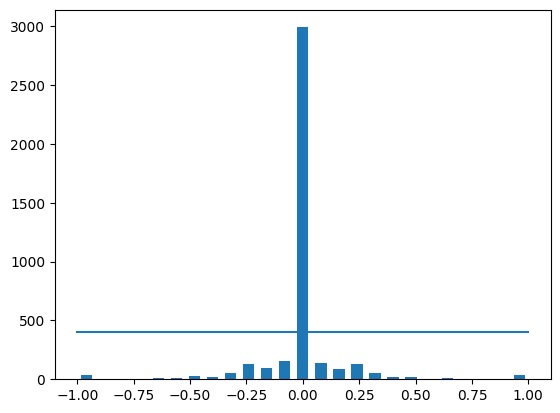

In [6]:
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))
print('total data:', len(data))

In [7]:
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

In [8]:
print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

removed: 2590
remaining: 1463


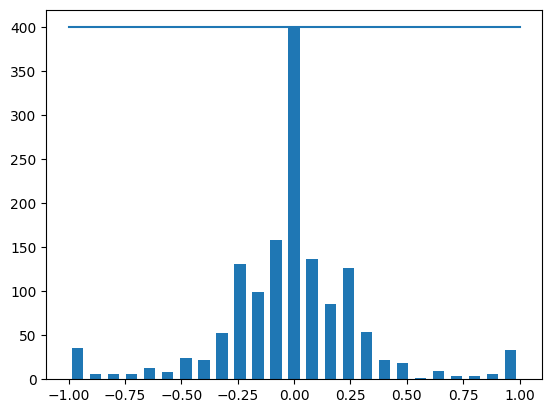

In [9]:
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [10]:
print(data.iloc[1])

center      center_2018_07_16_17_11_43_998.jpg
left        left_2018_07_16_17_11_43_998.jpg  
right       right_2018_07_16_17_11_43_998.jpg 
steering    0.0                               
throttle    0.0                               
reverse     0.0                               
speed       0.606834                          
Name: 6, dtype: object


In [11]:
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

In [12]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

C:\Users\DELL\AppData\Local\Temp\ipykernel_25248\2267315553.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
C:\Users\DELL\AppData\Local\Temp\ipykernel_25248\2267315553.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
C:\Users\DELL\AppData\Local\Temp\ipykernel_25248\2267315553.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.

Training Samples: 3511
Valid Samples: 878


Text(0.5, 1.0, 'Validation set')

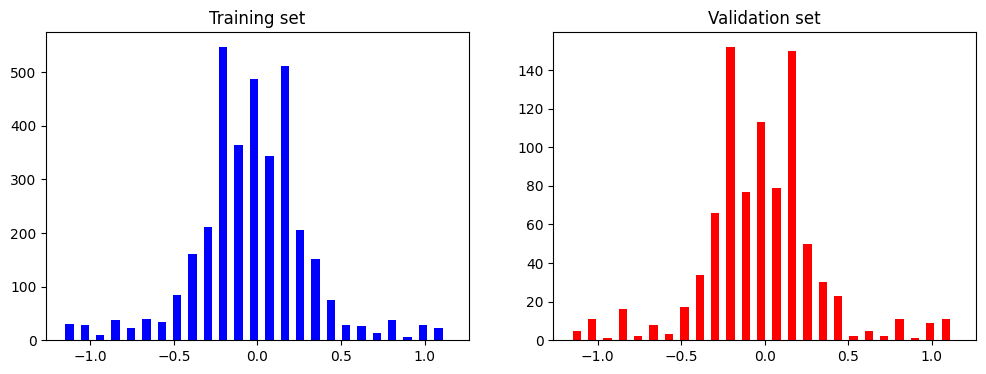

In [13]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

In [14]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

Text(0.5, 1.0, 'Zoomed Image')

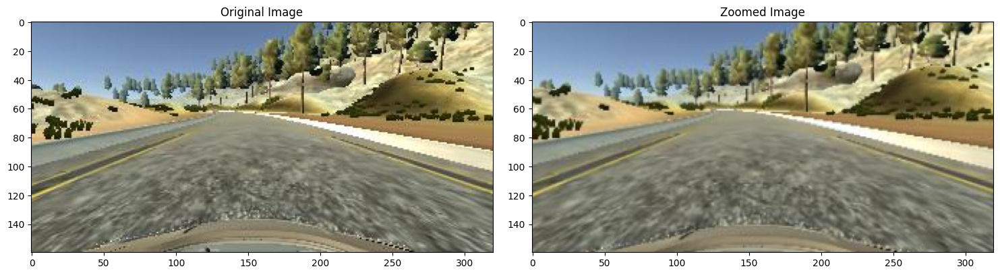

In [15]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

In [16]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

In [17]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

Text(0.5, 1.0, 'Panned Image')

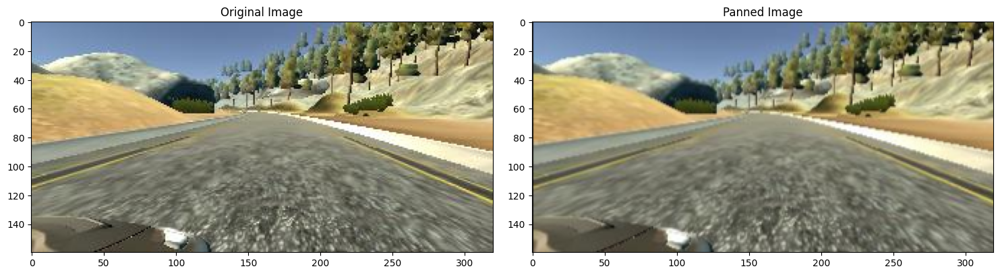

In [18]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

In [19]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

In [20]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

Text(0.5, 1.0, 'Brightness altered image ')

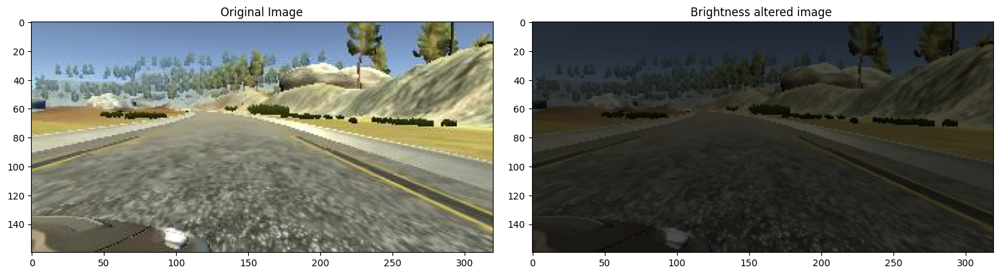

In [21]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

In [22]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]

In [23]:
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.413598')

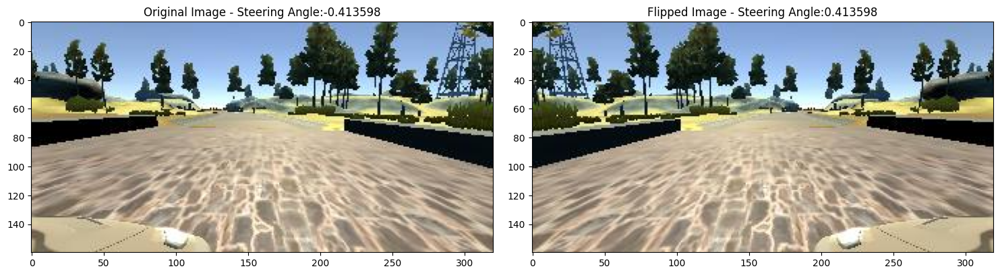

In [24]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [25]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

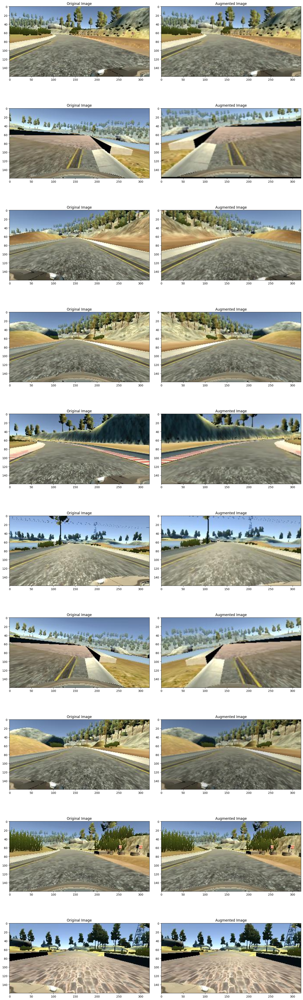

In [26]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [27]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

In [28]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

Text(0.5, 1.0, 'Preprocessed Image')

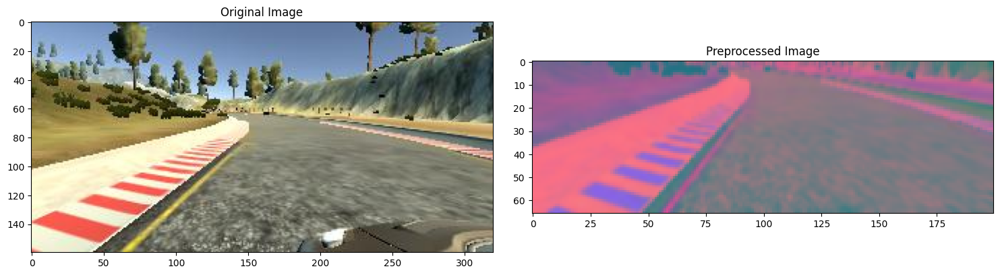

In [29]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [30]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

In [31]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

Text(0.5, 1.0, 'Validation Image')

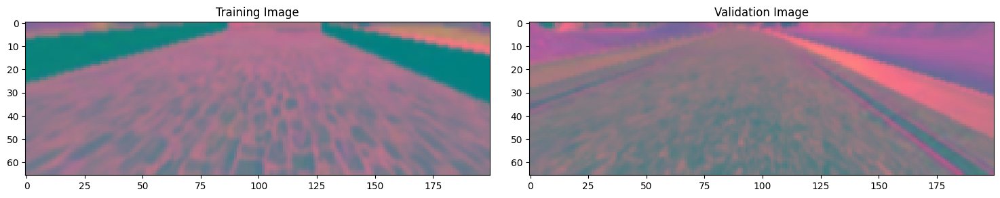

In [32]:
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [33]:
from keras.regularizers import l2
from keras.layers import Conv2D
from keras.regularizers import l1, l2

'''def nvidia_model():
    model = Sequential()

    # Layer 1
    model.add(Conv2D(24, kernel_size=(5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='relu'))
    model.add(BatchNormalization())

    # Layer 2
    model.add(Conv2D(36, kernel_size=(5, 5), strides=(2, 2), activation='relu'))
    model.add(BatchNormalization())

    # Layer 3
    model.add(Conv2D(48, kernel_size=(5, 5), strides=(2, 2), activation='relu'))
    model.add(BatchNormalization())

    # Layer 4
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
    model.add(BatchNormalization())

    # Layer 5
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
    model.add(BatchNormalization())

    model.add(Dropout(0.5))

    model.add(Flatten())

    # Fully connected layers
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.5))

    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))

    # Compile the model
    optimizer = Adam(learning_rate=1e-4)  # Adjusted learning rate
    model.compile(loss='mse', optimizer=optimizer)

    return model'''

def nvidia_model():
    model = Sequential()
    
    # Convolutional Layers
    model.add(Convolution2D(24, (5, 5), strides=(2, 2), activation='relu', input_shape=(66, 200, 3), kernel_regularizer=l2(0.001)))
    model.add(Convolution2D(36, (5, 5), strides=(2, 2), activation='relu', kernel_regularizer=l2(0.001)))
    model.add(Convolution2D(48, (5, 5), strides=(2, 2), activation='relu', kernel_regularizer=l2(0.001)))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    
    # Flatten Layer
    model.add(Flatten())
    
    # Fully Connected Layers
    model.add(Dense(100, activation='relu'))
    model.add(Dropout(0.2))  # Giảm dropout để tăng cường khả năng học
    model.add(Dense(50, activation='relu'))
    model.add(Dropout(0.2))  # Giảm dropout
    model.add(Dense(10, activation='relu'))
    
    # Output Layer
    model.add(Dense(1))  # Giả định mục tiêu là kiểm soát góc lái
    
    # Compile the model
    optimizer = Adam(learning_rate=1e-4)  # Adjusted learning rate
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [ ]:
    # model.add(Dropout(0.7))  # Tăng tỉ lệ dropout

    # model.add(Flatten())

    # # Fully connected layers
    # model.add(Dense(200, activation='elu', kernel_regularizer=l2(0.001)))  # Tăng số lượng neuron, sử dụng ELU và L2 regularization
    # model.add(Dropout(0.7))

    # model.add(Dense(100, activation='elu', kernel_regularizer=l2(0.001)))
    # model.add(Dropout(0.5))

    # model.add(Dense(50, activation='relu'))
    # model.add(Dense(10, activation='relu'))
    # model.add(Dense(1))

    # # Compile the model
    # optimizer = Adam(learning_rate=1e-4) 
    # model.compile(loss='mse', optimizer=optimizer)

    # return model

In [ ]:
'''
def nvidia_model():
    model = Sequential()

    # Layer 1
    model.add(Conv2D(24, kernel_size=(5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='relu'))
    model.add(BatchNormalization())

    # Layer 2
    model.add(Conv2D(36, kernel_size=(5, 5), strides=(2, 2), activation='relu'))
    model.add(BatchNormalization())

    # Layer 3
    model.add(Conv2D(48, kernel_size=(5, 5), strides=(2, 2), activation='relu'))
    model.add(BatchNormalization())

    # Layer 4
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
    model.add(BatchNormalization())

    # Layer 5
    model.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
    model.add(BatchNormalization())

    model.add(Dropout(0.7))  # Tăng tỷ lệ dropout

    model.add(Flatten())

    # Fully connected layers với L1 và L2 regularization
    model.add(Dense(200, activation='relu', kernel_regularizer=l2(0.001), bias_regularizer=l1(0.001))) 
    model.add(Dropout(0.7))

    model.add(Dense(100, activation='relu', kernel_regularizer=l2(0.001), bias_regularizer=l1(0.001)))
    model.add(Dropout(0.5))

    model.add(Dense(50, activation='relu'))
    model.add(Dense(10, activation='relu'))
    model.add(Dense(1))

    # Compile mô hình
    optimizer = Adam(learning_rate=1e-2)  # Bạn có thể điều chỉnh learning rate nếu cần
    model.compile(loss='mse', optimizer=optimizer)

    return model
'''

In [34]:
model = nvidia_model()

d:\xetuhanhgialap\.venv\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [35]:
model.build( input_shape=(None,66, 200, 3)) # `input_shape` is the shape of the input data
                         # e.g. input_shape = (None, 32, 32, 3)
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 31, 98, 24)     │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 14, 47, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 5, 22, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 2, 11, 48)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1056)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │       105,700 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 177,979 (695.23 KB)

 Trainable params: 177,979 (695.23 KB)

 Non-trainable params: 0 (0.00 B)

In [37]:
history = model.fit(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

'''# Huấn luyện mô hình với các thay đổi
history = model.fit(batch_generator(X_train, y_train, 128, 1), 
                    steps_per_epoch=300,  # Tăng steps_per_epoch
                    epochs=25,  # Tăng số lượng epochs
                    validation_data=batch_generator(X_valid, y_valid, 128, 0), 
                    validation_steps=300,
                    verbose=1,
                    shuffle=1)'''

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 286s 956ms/step - loss: 0.1633 - val_loss: 0.0988
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 237s 793ms/step - loss: 0.1062 - val_loss: 0.0773
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 235s 785ms/step - loss: 0.0865 - val_loss: 0.0651
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 231s 774ms/step - loss: 0.0788 - val_loss: 0.0587
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 228s 763ms/step - loss: 0.0726 - val_loss: 0.0571
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 218s 730ms/step - loss: 0.0686 - val_loss: 0.0525
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 199s 666ms/step - loss: 0.0656 - val_loss: 0.0492
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 159s 532ms/step - loss: 0.0627 - val_loss: 0.0492
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 164s 548ms/step - loss: 0.0606 - val_loss: 0.0439
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 181s 604ms/step - loss: 0.0598 - val_loss: 0.0429


'# Huấn luyện mô hình với các thay đổi\nhistory = model.fit(batch_generator(X_train, y_train, 128, 1), \n                    steps_per_epoch=300,  # Tăng steps_per_epoch\n                    epochs=25,  # Tăng số lượng epochs\n                    validation_data=batch_generator(X_valid, y_valid, 128, 0), \n                    validation_steps=300,\n                    verbose=1,\n                    shuffle=1)'

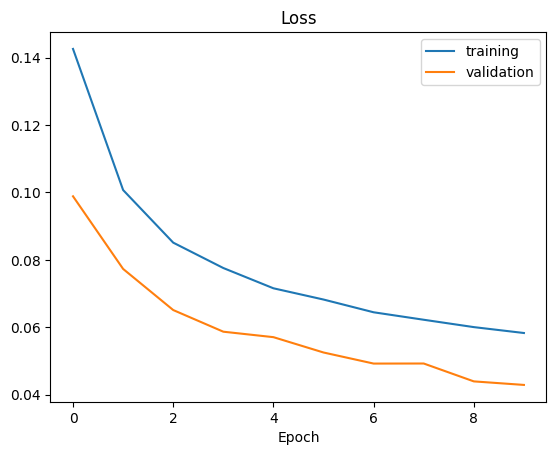

In [38]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')
model.save('model.h5')